# 1-Dimensional time-dependent Schrödinger Equation
#### The case of a particle in a well subject to any time-independent potential 

This is a continuation of the part dealing with the time-independet Schrödinger equation you can find here:<br><br>
[__1-Dimensional time-independent Schrödinger Equation__](https://colab.research.google.com/github/Focaccj85/jNotebooks/blob/main/SchroedingerTI.ipynb)<br><br>
So, from now on a brief introduction of the evolution of the wave function $\Psi(x,t)$ of a particle in a well with a generic initial state $\Psi(x,0)$ will be discussed.<br><br>
The case under exam deals with a particle, trapped in a 1-D well of length $L$. In the domain $x \in (0,L)$, a user defined time independent potential $V(x)$ can be applied.

As discussed in the notebook at the link above, the study of a particle confined in a well subject to a time-independent potential energy leads to the definition of a time-independent Hamiltonian $\hat{H}$ whose eigenvalues and eigenfunctions define respectively the quantized energy levels $E_k$ and their corresponding stationary wave functions $\psi_k(x)$.<br>
It is also true that if the initial state $\Psi(t,0)=\psi_{ini}(x)$ of the wave function coincides with one of the eigenstates (let's say $\psi_k(x)$) of the Hamiltonian, the time evolution of the state can be expressed as follows:
$$
\Psi_k(x,t)=e^{-i\frac{E_k}{\hbar}}\psi_k(x).
$$
This equation is nothing but a stationary wave-functions: the squared module $|\Psi_k(x,t)|^2$ is equal to $|\psi_k(x)|^2$ thus it is time independent. Furthermore the real part and the imaginary part of the wave-function are stationary waves (see the animation in the link above).  
<br>
Now it's time to move a step up!<br>

What if the particle is previously prepared in such a way initial state $\Psi(x,0)=\psi_{ini}(x)$ does NOT coincide with one of the eigenstates of the Hamiltonian?<br>
The answer comes again from the linear algebra.<br>
The fantastic trick is to express the initial state as a linear combination of the eigenstates of the Hamiltonian:<br>

$$
\psi_{ini}(x) = \sum_{j=0}^{\infty}c_j\psi_j(x),\;\sum_{j=0}^{\infty}|c_j|^2 = 1,
$$

where $\psi_j(x)$ is the normalized eigenfunction associated with the eigenvalue level $E_j$ of the Hamiltonian. Furthermore, the coefficient $c_j$ is such that its squared module stands for the probability of the particle to be measured in the energy level $E_j$<br><br>
Now, if an initial state $\psi_ini(x)$ is defined (let's say a localized gaussian wave packet), it is before necessary to express this wave function as a linear combination of the eigenstates of the Hamiltonian. In other terms, it is necessary to find the coefficients $c_j$ of the previous sum to go ahead.<br>
How to do that? Easy! Linear algebra again gives the answer! It's easy to prove that each coefficient $c_j$ is the projection of the initial wave function to the corresponding eigenfunction $\psi_j(x)$:
$$
c_j = \int_{-\infty}^{\infty} \psi_j(x)^*\psi_{ini}(x) \, dx = \int_{0}^{L} \psi_j(x)^*\psi_{ini}(x) \, dx.
$$

What about the time-dependence?<br>
It's the same! Each eigenstate $\psi_k(x)$ gives its time contribion ( $\Psi_k(x,t)=c_k\psi_k(x)e^{-i\frac{E_k}{\hbar}}$ ) such that the overall state evolves as follows:

$$
\Psi(x,t) = \sum_{j=0}^{\infty}c_j\psi_j(x)e^{-i\frac{E_j}{\hbar}},\;\sum_{j=0}^{\infty}|c_j|^2 = 1.
$$

Now it's time to code!

In [21]:
##MODULES IMPORTATION##

import numpy as np

#used to solve find the eigenvalues and eigenvectors of the tridiagonal matrix A
from scipy.linalg import eigh_tridiagonal

import matplotlib.pyplot as plt

#used for random colors choises
import random

from matplotlib.animation import FuncAnimation

#used to display the animation in the notebook
from IPython.display import display, HTML



In [22]:
#The CGS convention is used here

#hbar [erg*s]
h_bar = 1.055e-27
#mass of the electron [g]
m = 9.10938e-28
#Size of the region [cm]
L = 0.2e-7
#number of intervals (n+1 points)
n = 2000
#interval length [cm]
dx = L/n
#creates a vector of n+1 x-coordinates from 0 to L
x = np.linspace(0,L,n+1)

Below, a procedure to create a smooth trapezoidal profile for $V(x)$ is shown. Firtsly a function $u(x)$ is defined, then the potential energy is chosen to be proportional to $u(x)$: $V(x)=Ku(x)$, . Here is the definition $of u(x)$:
$$
u(x) = \left\{
    \begin{aligned}
    &0,\;\;&x < 0.8\frac{L}{2},\\
    &m(x),\;\;&0.8\frac{L}{2}\leq x \leq 0.9\frac{L}{2},\\
    &1,\;\;&0.9\frac{L}{2}< x < 1.1\frac{L}{2},\\
    &p(x),\;\;&1.1\frac{L}{2}\leq x \leq 1.2\frac{L}{2},\\
    &0,\;\;&x> 1.2\frac{L}{2},\\
    \end{aligned}
\right.
$$
where $m(x)$ and $p(x)$ are respectively two polynomials that represent the smooth transition from 0 to 1 and viceversa.<br>

The function m(x) (for p(x) the steps are the same) has been chosen with the following constraints:
+ $m\left(0.8\frac{L}{2}\right)=0$ (grants continuity of $u(x)$)
+ $m\left(0.9\frac{L}{2}\right)=1$ (grants continuity of $u(x)$)
+ $m'\left(0.8\frac{L}{2}\right)=0$ (grants continuity of $u'(x)$)
+ $m'\left(0.9\frac{L}{2}\right)=0$ (grants continuity of $u'(x)$)
+ $m''\left(0.85\frac{L}{2}\right)=0$ (grants a presence of two different signed concavities of m(x)).<br>
Of course these five constraints, together with the continuity of m(x) itself brings to a definition of a four degree polynomial:
$$
u(x) = ax^4+bx^3+cx^2+dx+e
$$
It's easy to see that the five coefficients can be found by solving a 5-dimensional linear system as shown in the next cell.<br>
Below $\mathbf{M}$ stands for the 5x5 matrix used to find the coefficients of $m(x)$, then $\mathbf{P}$ stands for the 5x5 matrix used to find the coefficients of $p(x)$

In [23]:
#Procedure to find m(x) and p(x)

alpha = L/2

#matrix form of the constraints to be satisfied from m(x)
M = [
    [(0.9*alpha)**4, (0.9*alpha)**3, (0.9*alpha)**2, (0.9*alpha), 1],
    [(0.8*alpha)**4, (0.8*alpha)**3, (0.8*alpha)**2, (0.8*alpha), 1],
    [4*(0.9*alpha)**3, 3*(0.9*alpha)**2, 2*(0.9*alpha), 1, 0],
    [4*(0.8*alpha)**3, 3*(0.8*alpha)**2, 2*(0.8*alpha), 1, 0],
    [12*(0.85*alpha)**2, 6*(0.85*alpha), 2*(0.85*alpha), 0, 0],
]

#matrix form of the constraints to be satisfied from p(x)
P = [
    [(1.1*alpha)**4, (1.1*alpha)**3, (1.1*alpha)**2, (1.1*alpha), 1],
    [(1.2*alpha)**4, (1.2*alpha)**3, (1.2*alpha)**2, (1.2*alpha), 1],
    [4*(1.1*alpha)**3, 3*(1.1*alpha)**2, 2*(1.1*alpha), 1, 0],
    [4*(1.2*alpha)**3, 3*(1.2*alpha)**2, 2*(1.2*alpha), 1, 0],
    [12*(1.15*alpha)**2, 6*(1.15*alpha), 2*(1.15*alpha), 0, 0],
]

# the vector of the constant terms 
#(the equations above have been arranged for both M and P in order to have the same constant terms vector b)
b = [[1],[0],[0],[0],[0]] 

#finds the coefficients of m(x)
poly_coeffs_left = np.linalg.solve(M,b)
#finds the coefficients of p(x)
poly_coeffs_right = np.linalg.solve(P,b)



C:\Users\alessandro.lorusso\AppData\Local\Temp\ipykernel_11556\26704660.py:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  v_x[i] = K*(poly_coeffs_left[0]*x_cut[i]**4+poly_coeffs_left[1]*x_cut[i]**3+poly_coeffs_left[2]*x_cut[i]**2+poly_coeffs_left[3]*x_cut[i]+ poly_coeffs_left[4])
C:\Users\alessandro.lorusso\AppData\Local\Temp\ipykernel_11556\26704660.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  v_x[i] = K*(poly_coeffs_right[0]*x_cut[i]**4+poly_coeffs_right[1]*x_cut[i]**3+poly_coeffs_right[2]*x_cut[i]**2+poly_coeffs_right[3]*x_cut[i]+ poly_coeffs_right[4])


Text(0.5, 0, 'X-axis [nm]')

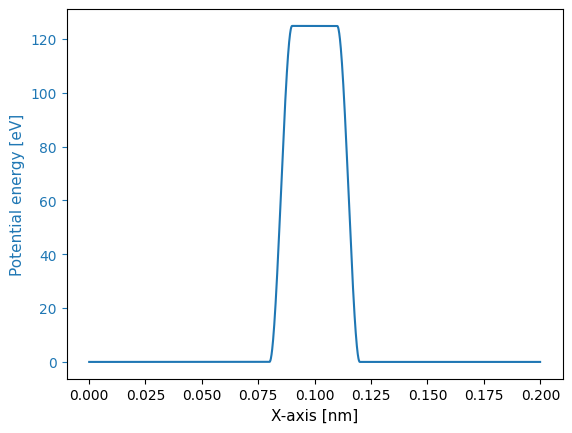

In [24]:
#Here the potential energy is defined. 
#A smooth trapezoidal potential centered in L/2 is returned as a (n-1) dimensional vector 
#The potential energy at the point x_0 and at the point x_n is ruled out and considered infinite

###AAA###
#If you want to define a potential energy of yours, please remember to work on the x[1:-1] and not direclty on x
#########
def V(x):
    x_cut = x[1:-1]
    v_x = np.zeros((len(x_cut)))
    K = 2e-10
    for i in range(len(x_cut)):
        if x_cut[i]>=0.8*(L/2) and x_cut[i]<0.9*(L/2):
            #m(x)
            v_x[i] = K*(poly_coeffs_left[0]*x_cut[i]**4+poly_coeffs_left[1]*x_cut[i]**3+poly_coeffs_left[2]*x_cut[i]**2+poly_coeffs_left[3]*x_cut[i]+ poly_coeffs_left[4]) 
        if x_cut[i]>=0.9*(L/2) and x_cut[i]<=1.1*(L/2):
            v_x[i] = K
        if x_cut[i]>1.1*(L/2) and x_cut[i]<=1.2*(L/2):
            #p(x)
            v_x[i] = K*(poly_coeffs_right[0]*x_cut[i]**4+poly_coeffs_right[1]*x_cut[i]**3+poly_coeffs_right[2]*x_cut[i]**2+poly_coeffs_right[3]*x_cut[i]+ poly_coeffs_right[4])
    return v_x

ax = plt.plot(x[1:-1]*1.0e7,V(x)*6.242e+11)[0]
plt.tick_params(axis='y', colors=ax.get_color())
plt.ylabel("Potential energy [eV]",fontsize=11,color = ax.get_color())
plt.xlabel("X-axis [nm]",fontsize=11)


In [25]:
#########SOLVING THE TIME INDEPENDET SCHROEDINGER EQUATION#############
#more info at the link shown above

#x-axis where our eigenfunctions are defined
xaxis = x[1:-1]

#Definition of the main diagonal of the matrix A and of its upper/lower diagonals
A_diag = (m/(h_bar**2))*V(x)+(1/(dx**2))*np.ones(n-1)
A_upper_lower_diag = (-0.5/(dx**2))*np.ones(len(A_diag)-1)

#Eigenvalues problem solving for the tridiagonal matrix A
#eigenvectors is a matrix whose columns [:,k] are eigenvectors associated with their own corresponding eigenvalue[k]
(eigenvalues,eigenvectors) = eigh_tridiagonal(A_diag,A_upper_lower_diag)

#inits the array of the energy levels
energy_level = np.zeros(len(eigenvalues))
#transposition of the matrix of the eigenfunctions in order to have each eigenfunction as a row of this matrix
psi = eigenvectors.T
#square all the elements of all the psi functions
psi_squared = psi**2

#Psi normalization
for i in range(len(psi)):

    #calculation of the integral of the i-th psi_squared function 
    # trapezoidal method used (an alternative to the integral calculation with dx*np.sum(psi_squared[i]))
    norm_factor = np.trapz(psi_squared[i], xaxis)
    #normalization of psi_squared
    psi_squared[i] = psi_squared[i]/norm_factor
    #scaling of the wave functions
    psi[i] = psi[i]/np.sqrt(norm_factor)
    #extraction of the energy levels from the eigenvalues of A
    energy_level[i] = eigenvalues[i]*((h_bar**2)/m)



C:\Users\alessandro.lorusso\AppData\Local\Temp\ipykernel_11556\26704660.py:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  v_x[i] = K*(poly_coeffs_left[0]*x_cut[i]**4+poly_coeffs_left[1]*x_cut[i]**3+poly_coeffs_left[2]*x_cut[i]**2+poly_coeffs_left[3]*x_cut[i]+ poly_coeffs_left[4])
C:\Users\alessandro.lorusso\AppData\Local\Temp\ipykernel_11556\26704660.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  v_x[i] = K*(poly_coeffs_right[0]*x_cut[i]**4+poly_coeffs_right[1]*x_cut[i]**3+poly_coeffs_right[2]*x_cut[i]**2+poly_coeffs_right[3]*x_cut[i]+ poly_coeffs_right[4])


The first four energy levels from $E_0$ (the ground level) to $E_3$ will be shown.<br>

In [26]:
#Number of curves that will be shown on the following plots
N_curves = 4

#Random clear and human-visible color generator ( to paint our curves :-) )
def random_clear_color(rgb=False):
    # Generates random values for R, G, and B channels ensuring they are not too light
    # Avoiding too light (200-255)
    r = random.randint(0, 200)  
    g = random.randint(0, 200)
    b = random.randint(0, 200)
    
    if not rgb:
        # Converts the RGB values to the hex format #RRGGBB
        return f"#{r:02X}{g:02X}{b:02X}"
    else:
        return (r/255, g/255, b/255)

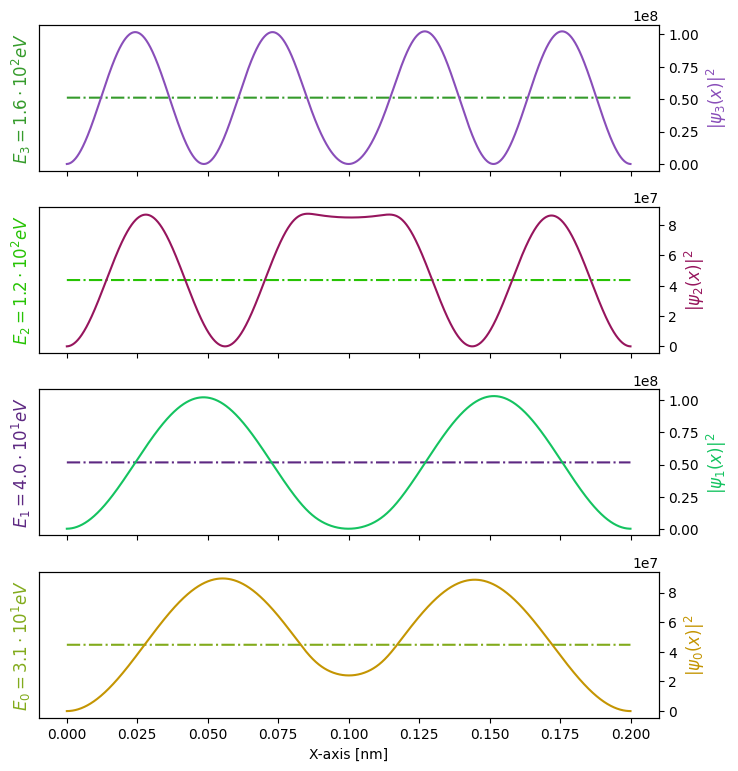

In [27]:
# Creates the figure with stacked plots, each having two independent y-axes (left and right) and a commom x-axis
# the x-axis will be scaled to [nm]
# the left y-axes are related to the energy values expressed in [eV]
# the right y-axes are related to the probability densities of the particle position.
fig, left_axes = plt.subplots(nrows=N_curves, ncols=1, sharex=True, figsize=(8, 9),dpi=100)
#information of the plots about the right y-axis
right_axes = []

#ciclyng for each subplot
for i in range(N_curves):

    #choosing randomly the colors of the curves/labels for each axis
    random_color_y_left = random_clear_color()
    random_color_y_right = random_clear_color()
    
    #xaxis is scaled from [cm] to [nm]
    #plotting the energy level (on the left y-axis) as an horizontal line
    left_axes[N_curves-i-1].plot(xaxis*1.0e7, energy_level[i]*np.ones(len(xaxis)),color = random_color_y_left,linestyle='-.')
    
    #creating a second y-axis in this subplot, granting the same xasis
    right_axes.append(left_axes[N_curves-i-1].twinx())
    #plotting the squared psi function on the right y-axis (xaxis scaled from [cm] to [nm])
    right_axes[i].plot(xaxis*1.0e7, psi_squared[i],color = random_color_y_right)

    #hiding the values on the left axis
    left_axes[N_curves-i-1].tick_params(axis = 'y',which='both',left=False,labelleft=False)
    #scaling energy values from [erg] to [eV]
    ev_energy = energy_level[i]*6.242e+11

    #######################################
    #some dressing on the left axis
    #######################################
    left_axis_str = r'$E_'+str(i)+'='+f"{ev_energy:.1e}"+"eV$"
    left_axis_str = left_axis_str.replace("e-00","").replace("e+00","").replace("e-0","e-").replace("e+0","e+")
    if ("e-" in left_axis_str) or ("e+" in left_axis_str):
        left_axis_str = left_axis_str.replace("e+","\\cdot 10^{").replace("e-","\\cdot 10^{-").replace("eV$","}eV$")    
    left_axes[N_curves-i-1].set_ylabel(left_axis_str,color=random_color_y_left,fontsize=12)
    #######################################

    #some dressing on the right axis
    right_axes[i].set_ylabel(r'$|\psi_'+str(i)+'(x)|^{2}$',color = random_color_y_right,fontsize=12)
#end of the for cycle

#fixing text on the common X-axis
left_axes[N_curves-1].set_xlabel('X-axis [nm]')

#compactig the subplots
plt.subplots_adjust(hspace=0.25)

# Showing the plot
plt.show()

The function $|\psi_{ini}(x)|^2$ is defined as a normalized gaussian function centered in $x=\frac{L}{4}$ and with a low standard deviation $\sigma$ (the wave function must tend necessarly to 0 when x tends to 0 or to L).

Text(0.5, 0, 'X-axis [nm]')

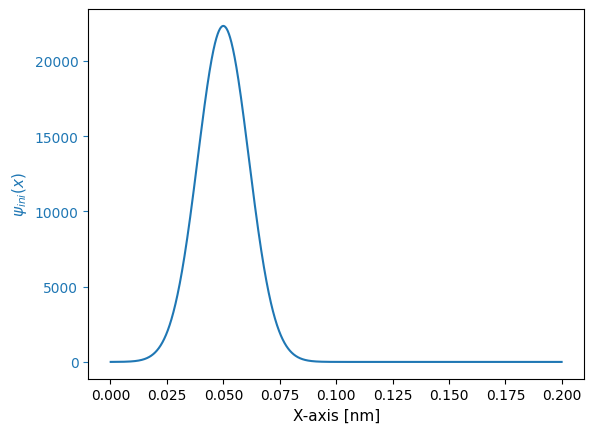

In [28]:
#Creates a gaussian packet

# Parameters for the Gaussian distribution
# Mean of the Gaussian
mean = L/4
# Standard deviation (sigma)        
sigma = (L/25)

#psi is the square root of the gaussian distribution
psi_ini = np.sqrt((1/(sigma*np.sqrt(2*np.pi)))*np.exp(-0.5*((xaxis-mean)/sigma)**2))

ax = plt.plot(xaxis*1.0e7,psi_ini)[0]
plt.tick_params(axis='y', colors=ax.get_color())
plt.ylabel(r"$\psi_{ini}(x)$",fontsize=11,color = ax.get_color())
plt.xlabel("X-axis [nm]",fontsize=11)

The code below finds the vector of the coefficients $c_j$.<br>
A cross-check is done to make sure that the superposition $F(x)$ of the eigenfunctions with the coefficient found, is actually equal to $\psi_{ini}(x)$

Text(0.5, 0, 'X-axis [nm]')

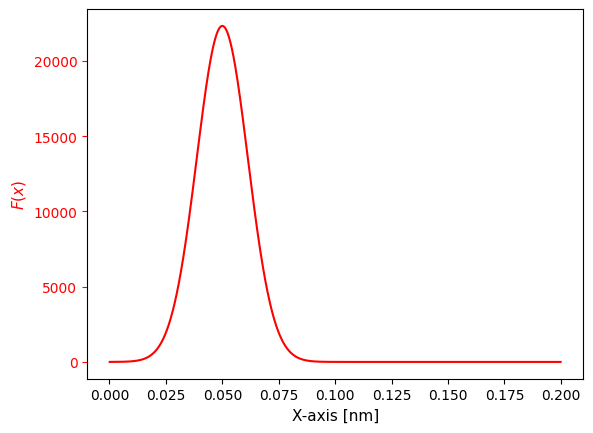

In [29]:
superposition_coeffs = np.array([np.dot(psi_ini,eigenstate) for eigenstate in psi ])

superposition_coeffs = superposition_coeffs/np.sqrt(np.dot(superposition_coeffs,superposition_coeffs))

#F(x) is the reconstruction of the original wave packet using the superposition of the eigenstates
Fx = np.dot(psi.T,superposition_coeffs)

ax = plt.plot(xaxis*1.0e7,Fx,color = 'red')[0]
plt.tick_params(axis='y', colors=ax.get_color())
plt.ylabel(r"$F(x)$",fontsize=11,color = ax.get_color())
plt.xlabel("X-axis [nm]",fontsize=11)

C:\Users\alessandro.lorusso\AppData\Local\Temp\ipykernel_11556\26704660.py:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  v_x[i] = K*(poly_coeffs_left[0]*x_cut[i]**4+poly_coeffs_left[1]*x_cut[i]**3+poly_coeffs_left[2]*x_cut[i]**2+poly_coeffs_left[3]*x_cut[i]+ poly_coeffs_left[4])
C:\Users\alessandro.lorusso\AppData\Local\Temp\ipykernel_11556\26704660.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  v_x[i] = K*(poly_coeffs_right[0]*x_cut[i]**4+poly_coeffs_right[1]*x_cut[i]**3+poly_coeffs_right[2]*x_cut[i]**2+poly_coeffs_right[3]*x_cut[i]+ poly_coeffs_right[4])


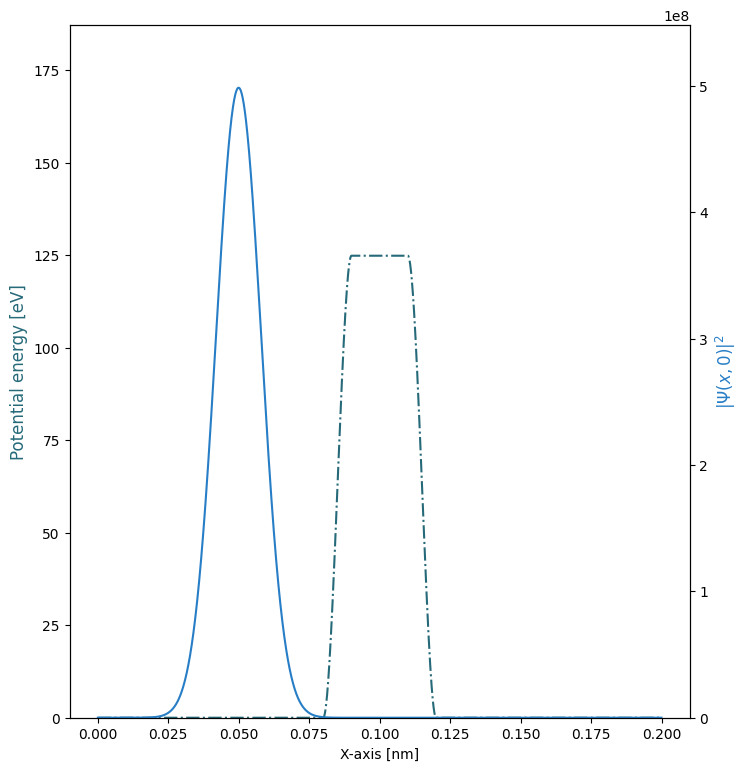

In [30]:
#yaxis is scaled from [erg] to [eV]
pot_energy = V(x)*6.242e+11

# Creates the figure with stacked plots, each having two independent y-axes (left and right) and a commom x-axis
# the x-axis will be scaled to [nm]
# the left y-axis are related to the energy values expressed in [eV]
# the right y-axes are related to the probability densities of the particle position.
fig, left_yax = plt.subplots(sharex=True, figsize=(8, 9),dpi=100)

#choosing randomly the colors of the curves/labels for each axis
random_color_y_left = random_clear_color()
random_color_y_right = random_clear_color()
    
#xaxis is scaled from [cm] to [nm]
#plotting the energy level (on the left y-axis) as an horizontal line
left_yax.plot(xaxis*1.0e7, pot_energy,color = random_color_y_left,linestyle='-.')
#Setting the limits for the left y-axis
left_yax.set_ylim(min(pot_energy),1.5*max(pot_energy))

#creating a second y-axis in this subplot, granting the same xasis
right_yax = left_yax.twinx()
right_yax.set_ylim(0,1.1*max(psi_ini**2))
#plotting the squared psi function on the right y-axis (xaxis scaled from [cm] to [nm])
right_yax.plot(xaxis*1.0e7, psi_ini**2,color = random_color_y_right)

#######################################
#some dressing on the left axis
#######################################
left_axis_str = "Potential energy [eV]"
left_yax.set_ylabel(left_axis_str,color=random_color_y_left,fontsize=12)
#######################################

#some dressing on the right axis
right_yax.set_ylabel(r'$|\Psi(x,0)|^{2}$',color = random_color_y_right,fontsize=12)
#end of the for cycle

#fixing text on the common X-axis
left_yax.set_xlabel('X-axis [nm]')

# Showing the plot
plt.show()

In [31]:
#Since the frequencies are too high, a time scaling of a factor dt is needed,
#furthermore more frames are needed and a frame update interval has to be increased
#The animation duration has been arranged in order to obtain 1 full period vision of the ground level wave function
lower_omega = energy_level[0]/h_bar
num_frames = 300
dt = (lower_omega*num_frames)/(2*np.pi)

#this list contains all the information about the plots that need to be updated on each frame
#this list will be initialized once and returned modified at each frame update
axes = []

plt.clf()
right_yax.cla()
right_yax = left_yax.twinx()
right_yax.set_ylim(0,1.1*max(psi_ini**2))
right_yax.set_ylabel(r'$|\Psi(x,t)|^{2}$',color = random_color_y_right,fontsize=12)
right_yax.set_ylim(0,1.1*max(psi_ini**2))


fig.set_size_inches(7, 7)
    
#hiding the values on the right axis
right_yax.tick_params(axis = 'y',which='both',right=False,labelright=False)

#appending the plots information to the list that will be updated in the animation
#real part of the wave function
axes.append(right_yax.plot(xaxis * 1.0e7, np.zeros(len(xaxis)), color = random_color_y_right)[0])
##############################################

#Transposition of psi in order to have each eigenfunction as a column (easier to performa matrix calcuations)
psi = psi.T

# Animation update function
def update(frame):
    
    t = (frame/dt)

    re_Psi_t = np.array([np.cos(t*energy_level[i]/h_bar) for i in range(len(energy_level))])
    im_Psi_t = np.array([np.sin(t*energy_level[i]/h_bar) for i in range(len(energy_level))])
    Re_Psi = psi @ (superposition_coeffs*re_Psi_t)
    Im_Psi = psi @ (superposition_coeffs*im_Psi_t)
    Psi_squared = Re_Psi**2+Im_Psi**2
    # Redraws with new data of the real part of the wave function
    axes[0].set_ydata(Psi_squared) 

    # Return all the axes for updating
    return axes

# Creates the animation object
ani = FuncAnimation(fig, update, frames=num_frames, interval=120, blit=True)

# Generates JavaScript HTML
ani_html = ani.to_jshtml()

<Figure size 640x480 with 0 Axes>

In [32]:
# Displays the animation
display(HTML(ani_html))